## data exploring

Number of Classes: 27
Classes: ['A', 'B', 'Blank', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

===== CLASS DISTRIBUTION =====
A : 900 images
B : 900 images
Blank : 900 images
C : 900 images
D : 900 images
E : 900 images
F : 900 images
G : 900 images
H : 900 images
I : 900 images
J : 900 images
K : 900 images
L : 900 images
M : 900 images
N : 900 images
O : 900 images
P : 900 images
Q : 900 images
R : 900 images
S : 900 images
T : 900 images
U : 900 images
V : 900 images
W : 900 images
X : 900 images
Y : 900 images
Z : 900 images

===== IMAGE SIZE STATISTICS =====
Width:   min=513, max=513, mean=513.00, std=0.00
Height:  min=512, max=512, mean=512.00, std=0.00


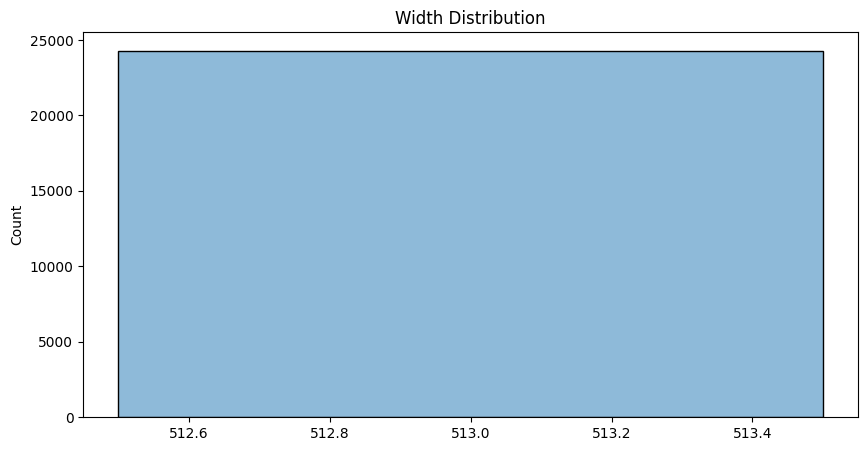

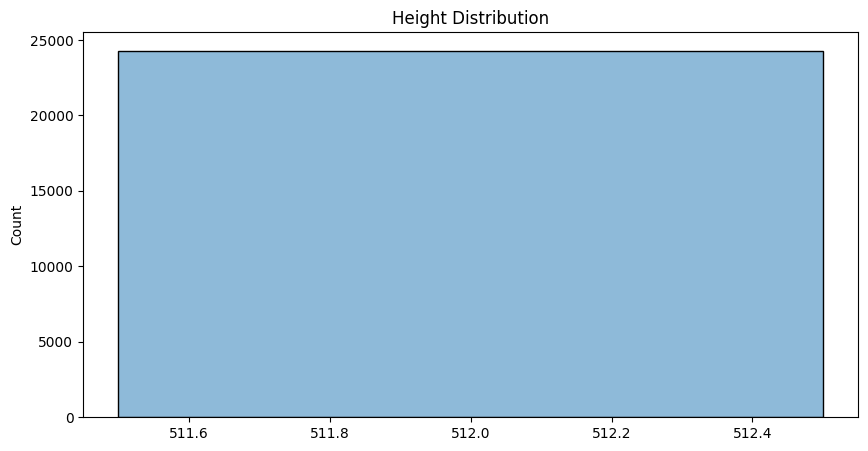

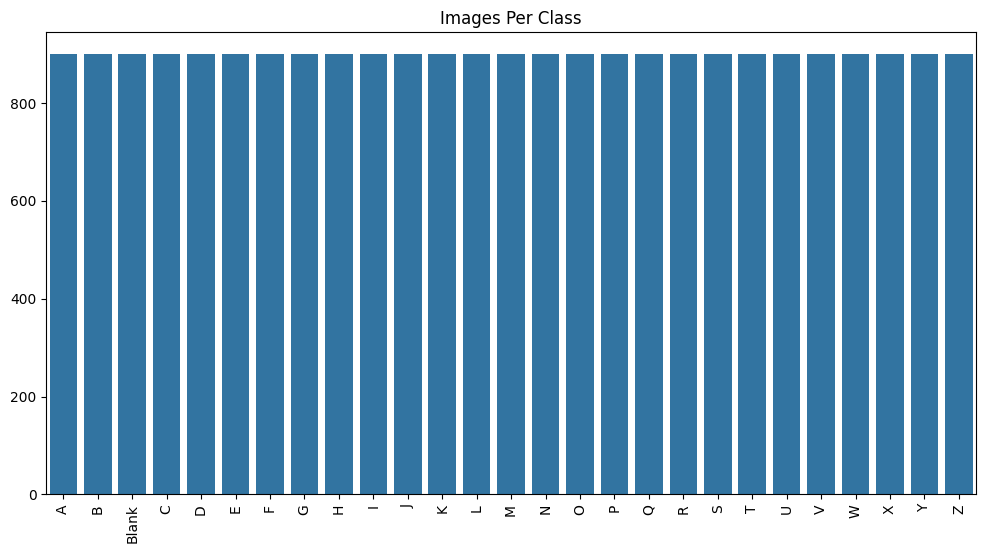

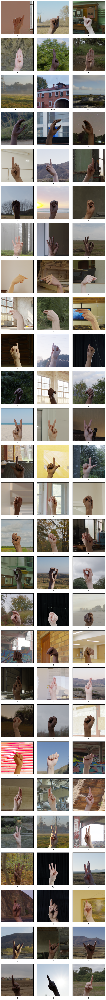


===== CORRUPTED IMAGES =====
No corrupted images found.


In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import seaborn as sns

DATA_DIR = r"D:\Gemy Study\FAI\Deep Learning\Project\data\Train_Alphabet"

# ------------------------------------------
# 1) Collect basic info about folders
# ------------------------------------------
classes = sorted(os.listdir(DATA_DIR))
print(f"Number of Classes: {len(classes)}")
print("Classes:", classes)

data_info = []
corrupted_images = []

# ------------------------------------------
# 2) Loop on each folder and analyze images
# ------------------------------------------
for cls in classes:
    folder = os.path.join(DATA_DIR, cls)
    img_files = os.listdir(folder)
    
    sizes = []
    count = 0

    for img_name in img_files:
        img_path = os.path.join(folder, img_name)

        try:
            img = Image.open(img_path)
            sizes.append(img.size)      # (width, height)
            count += 1
        except Exception:
            corrupted_images.append(img_path)

    data_info.append([cls, count, sizes])

# ------------------------------------------
# 3) Summary similar to pandas describe
# ------------------------------------------
print("\n===== CLASS DISTRIBUTION =====")
for cls, count, _ in data_info:
    print(f"{cls} : {count} images")

# Convert to numeric analyses
widths = []
heights = []

for _, _, sizes in data_info:
    for w, h in sizes:
        widths.append(w)
        heights.append(h)

widths = np.array(widths)
heights = np.array(heights)

print("\n===== IMAGE SIZE STATISTICS =====")
print(f"Width:   min={widths.min()}, max={widths.max()}, mean={widths.mean():.2f}, std={widths.std():.2f}")
print(f"Height:  min={heights.min()}, max={heights.max()}, mean={heights.mean():.2f}, std={heights.std():.2f}")

# ------------------------------------------
# 4) Plot distribution
# ------------------------------------------
plt.figure(figsize=(10,5))
sns.histplot(widths, kde=True)
plt.title("Width Distribution")
plt.show()

plt.figure(figsize=(10,5))
sns.histplot(heights, kde=True)
plt.title("Height Distribution")
plt.show()

# ------------------------------------------
# 5) Class count plot
# ------------------------------------------
class_names = [c for c,_,_ in data_info]
class_counts = [cnt for _,cnt,_ in data_info]

plt.figure(figsize=(12,6))
sns.barplot(x=class_names, y=class_counts)
plt.xticks(rotation=90)
plt.title("Images Per Class")
plt.show()

# ------------------------------------------
# 6) Show example images from each class
# ------------------------------------------
def show_images_per_class(samples=5, img_size=(160, 160)):
    valid_ext = ('.jpg', '.jpeg', '.png', '.bmp')

    plt.figure(figsize=(samples * 3, len(classes) * 3))
    idx = 1

    for cls in classes:
        folder = os.path.join(DATA_DIR, cls)

        images = [
            img for img in os.listdir(folder)
            if img.lower().endswith(valid_ext)
        ]

        for img_name in images[:samples]:
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)

            if img is None:
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, img_size)

            plt.subplot(len(classes), samples, idx)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.xlabel(cls, fontsize=9, labelpad=6)
            idx += 1

    plt.tight_layout()
    plt.show()

show_images_per_class(samples=3)

# ------------------------------------------
# 7) Print corrupted images if found
# ------------------------------------------
print("\n===== CORRUPTED IMAGES =====")
if len(corrupted_images) == 0:
    print("No corrupted images found.")
else:
    print(f"{len(corrupted_images)} corrupted images detected:")
    for img in corrupted_images:
        print(img)


Number of Classes: 27
Classes: ['A', 'B', 'Blank', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

===== CLASS DISTRIBUTION =====
A : 100 images
B : 100 images
Blank : 100 images
C : 100 images
D : 100 images
E : 100 images
F : 100 images
G : 100 images
H : 100 images
I : 100 images
J : 100 images
K : 100 images
L : 100 images
M : 100 images
N : 100 images
O : 100 images
P : 100 images
Q : 100 images
R : 100 images
S : 100 images
T : 100 images
U : 100 images
V : 100 images
W : 100 images
X : 100 images
Y : 100 images
Z : 100 images

===== IMAGE SIZE STATISTICS =====
Width:   min=513, max=513, mean=513.00, std=0.00
Height:  min=512, max=512, mean=512.00, std=0.00


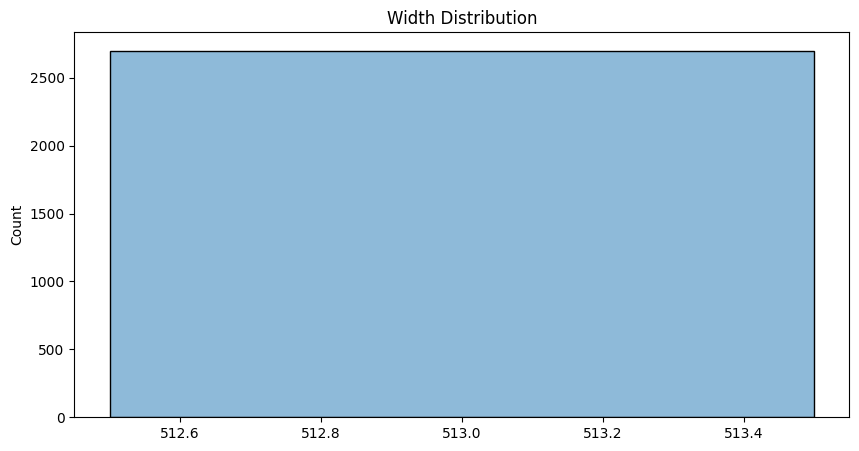

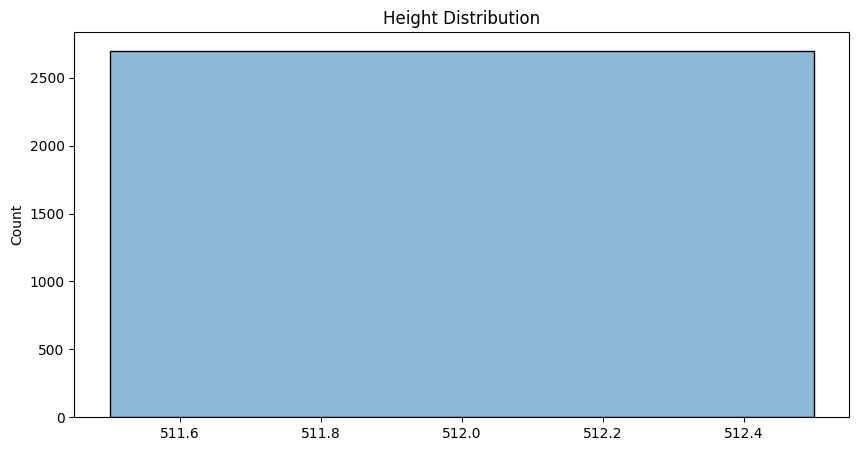

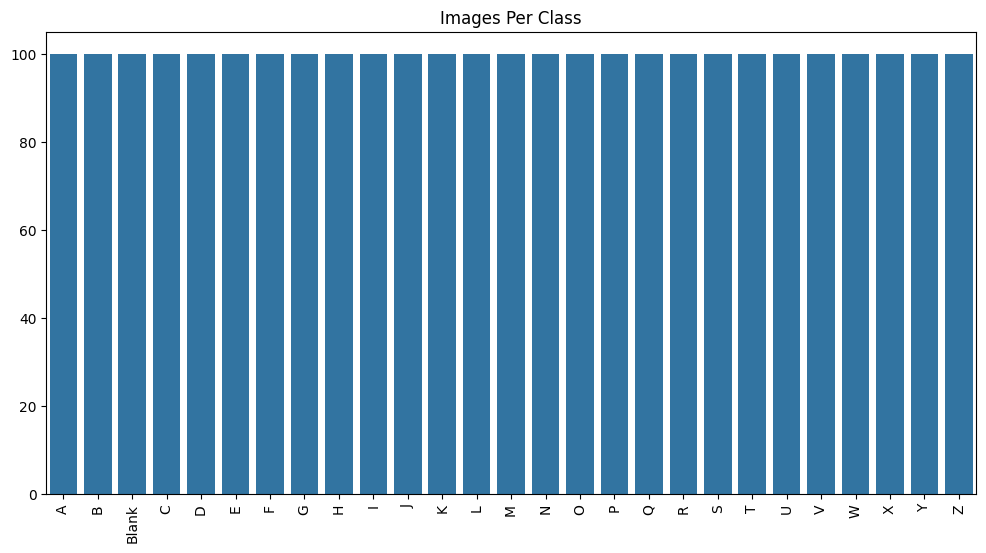

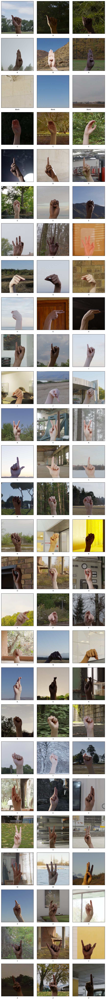


===== CORRUPTED IMAGES =====
No corrupted images found.


In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import seaborn as sns

DATA_DIR = r"D:\Gemy Study\FAI\Deep Learning\Project\data\Test_Alphabet"

# ------------------------------------------
# 1) Collect basic info about folders
# ------------------------------------------
classes = sorted(os.listdir(DATA_DIR))
print(f"Number of Classes: {len(classes)}")
print("Classes:", classes)

data_info = []
corrupted_images = []

# ------------------------------------------
# 2) Loop on each folder and analyze images
# ------------------------------------------
for cls in classes:
    folder = os.path.join(DATA_DIR, cls)
    img_files = os.listdir(folder)
    
    sizes = []
    count = 0

    for img_name in img_files:
        img_path = os.path.join(folder, img_name)

        try:
            img = Image.open(img_path)
            sizes.append(img.size)      # (width, height)
            count += 1
        except Exception:
            corrupted_images.append(img_path)

    data_info.append([cls, count, sizes])

# ------------------------------------------
# 3) Summary similar to pandas describe
# ------------------------------------------
print("\n===== CLASS DISTRIBUTION =====")
for cls, count, _ in data_info:
    print(f"{cls} : {count} images")

# Convert to numeric analyses
widths = []
heights = []

for _, _, sizes in data_info:
    for w, h in sizes:
        widths.append(w)
        heights.append(h)

widths = np.array(widths)
heights = np.array(heights)

print("\n===== IMAGE SIZE STATISTICS =====")
print(f"Width:   min={widths.min()}, max={widths.max()}, mean={widths.mean():.2f}, std={widths.std():.2f}")
print(f"Height:  min={heights.min()}, max={heights.max()}, mean={heights.mean():.2f}, std={heights.std():.2f}")

# ------------------------------------------
# 4) Plot distribution
# ------------------------------------------
plt.figure(figsize=(10,5))
sns.histplot(widths, kde=True)
plt.title("Width Distribution")
plt.show()

plt.figure(figsize=(10,5))
sns.histplot(heights, kde=True)
plt.title("Height Distribution")
plt.show()

# ------------------------------------------
# 5) Class count plot
# ------------------------------------------
class_names = [c for c,_,_ in data_info]
class_counts = [cnt for _,cnt,_ in data_info]

plt.figure(figsize=(12,6))
sns.barplot(x=class_names, y=class_counts)
plt.xticks(rotation=90)
plt.title("Images Per Class")
plt.show()

# ------------------------------------------
# 6) Show example images from each class
# ------------------------------------------
def show_images_per_class(samples=5, img_size=(160, 160)):
    valid_ext = ('.jpg', '.jpeg', '.png', '.bmp')

    plt.figure(figsize=(samples * 3, len(classes) * 3))
    idx = 1

    for cls in classes:
        folder = os.path.join(DATA_DIR, cls)

        images = [
            img for img in os.listdir(folder)
            if img.lower().endswith(valid_ext)
        ]

        for img_name in images[:samples]:
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)

            if img is None:
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, img_size)

            plt.subplot(len(classes), samples, idx)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.xlabel(cls, fontsize=9, labelpad=6)
            idx += 1

    plt.tight_layout()
    plt.show()

show_images_per_class(samples=3)

# ------------------------------------------
# 7) Print corrupted images if found
# ------------------------------------------
print("\n===== CORRUPTED IMAGES =====")
if len(corrupted_images) == 0:
    print("No corrupted images found.")
else:
    print(f"{len(corrupted_images)} corrupted images detected:")
    for img in corrupted_images:
        print(img)


## preprocessing 

In [ ]:
import cv2
import os
import mediapipe as mp
import numpy as np
from tqdm import tqdm
import random

# =============== MediaPipe Hands ===================
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(
    static_image_mode=True,
    max_num_hands=1,
    min_detection_confidence=0.4
)

def detect_hand_bbox(landmarks, img_w, img_h, extra=60):

    xs = [int(lm.x * img_w) for lm in landmarks]
    ys = [int(lm.y * img_h) for lm in landmarks]

    x_min = max(0, min(xs) - extra)
    y_min = max(0, min(ys) - extra)
    x_max = min(img_w, max(xs) + extra)
    y_max = min(img_h, max(ys) + extra)

    return x_min, y_min, x_max, y_max

# -------------------- Augmentations --------------------

def random_augment(img):

    # Random Brightness
    if random.random() < 0.4:
        img = cv2.convertScaleAbs(img, alpha=random.uniform(0.7, 1.3))

    # Random Contrast
    if random.random() < 0.4:
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        l = cv2.equalizeHist(l)
        img = cv2.merge((l, a, b))
        img = cv2.cvtColor(img, cv2.COLOR_LAB2BGR)

    # Random Noise
    if random.random() < 0.3:
        noise = np.random.randint(0, 20, img.shape, dtype='uint8')
        img = cv2.add(img, noise)

    # Random Blur
    if random.random() < 0.3:
        img = cv2.GaussianBlur(img, (5, 5), 0)

    # Random Rotation
    if random.random() < 0.4:
        h, w = img.shape[:2]
        angle = random.uniform(-20, 20)
        M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
        img = cv2.warpAffine(img, M, (w, h))

    # Random Perspective
    if random.random() < 0.3:
        h, w = img.shape[:2]
        pts1 = np.float32([[0,0],[w,0],[0,h],[w,h]])
        shift = random.randint(0, 40)
        pts2 = np.float32([[shift,0],[w-shift,0],[0,h],[w,h]])
        M = cv2.getPerspectiveTransform(pts1, pts2)
        img = cv2.warpPerspective(img, M, (w,h))

    return img


# -------------------- Main Processing --------------------

def process_image(image_path, size=(128, 128)):
    img = cv2.imread(image_path)
    if img is None:
        return None

    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = hands.process(rgb)

    # if there no hand come back to original 
    if not result.multi_hand_landmarks:
        return cv2.resize(img, size)

    h, w, _ = img.shape
    lm = result.multi_hand_landmarks[0].landmark
    x1, y1, x2, y2 = detect_hand_bbox(lm, w, h)

    # crop + background kept
    cropped = img[y1:y2, x1:x2]

    if cropped.size == 0:
        return cv2.resize(img, size)

    # Apply strong augment
    cropped = random_augment(cropped)

    resized = cv2.resize(cropped, size)
    return resized


def clean_dataset(old_dir, new_dir, limit_per_class=600):
    os.makedirs(new_dir, exist_ok=True)
    classes = sorted(os.listdir(old_dir))

    print("Classes:", classes)

    for cls in tqdm(classes):
        old_path = os.path.join(old_dir, cls)
        new_path = os.path.join(new_dir, cls)

        os.makedirs(new_path, exist_ok=True)

        images = os.listdir(old_path)
        images = images[:limit_per_class]

        for img_name in images:
            src = os.path.join(old_path, img_name)
            dst = os.path.join(new_path, img_name)

            processed = process_image(src)
            if processed is not None:
                cv2.imwrite(dst, processed)

    print(" DONE preprocessing.")


# Run
OLD = r"D:\Gemy Study\FAI\Deep Learning\Project\data\Train_Alphabet"
NEW = r"processed_dataset_final"

clean_dataset(OLD, NEW)

Classes: ['A', 'B', 'Blank', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


  0%|          | 0/27 [00:00<?, ?it/s]d:\Gemy Study\FAI\Deep Learning\Project\DL_env\Lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '
100%|██████████| 27/27 [08:54<00:00, 19.79s/it]

📌 DONE preprocessing.


## model

Using Device: cuda
⏳ Calculating dataset mean & std ...
📌 Mean  = tensor([0.4822, 0.4417, 0.3973])
📌 Std   = tensor([0.2228, 0.2257, 0.2268])
🚀 Starting Training for 10 epochs...


Epoch 1: Train=2.6555 | Val=1.4107 | Acc=63.77%


Epoch 2: Train=1.1916 | Val=0.6974 | Acc=80.96%


Epoch 3: Train=0.7306 | Val=0.4901 | Acc=86.02%


Epoch 4: Train=0.5126 | Val=0.3987 | Acc=88.33%


Epoch 5: Train=0.4011 | Val=0.3400 | Acc=90.09%


Epoch 6: Train=0.3053 | Val=0.3069 | Acc=91.20%


Epoch 7: Train=0.2496 | Val=0.2744 | Acc=91.91%


Epoch 8: Train=0.2025 | Val=0.2409 | Acc=92.53%


Epoch 9: Train=0.1678 | Val=0.2073 | Acc=93.92%


Epoch 10: Train=0.1350 | Val=0.2091 | Acc=94.04%
✅ Training Done! Best Accuracy = 94.04%


C:\Users\Mostafa\AppData\Local\Temp\ipykernel_15628\1793422550.py:217: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_model.pth"))


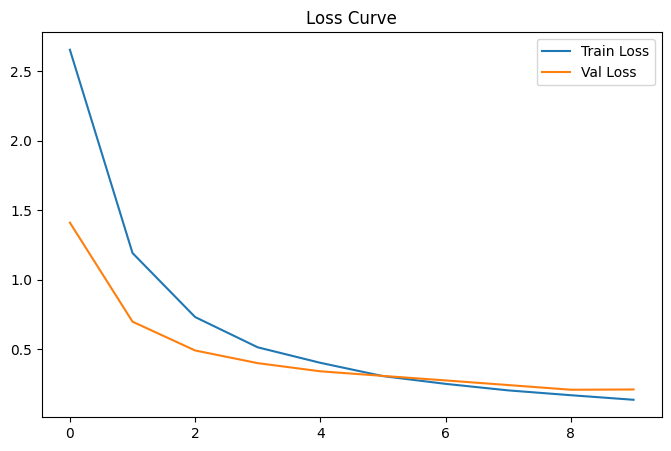

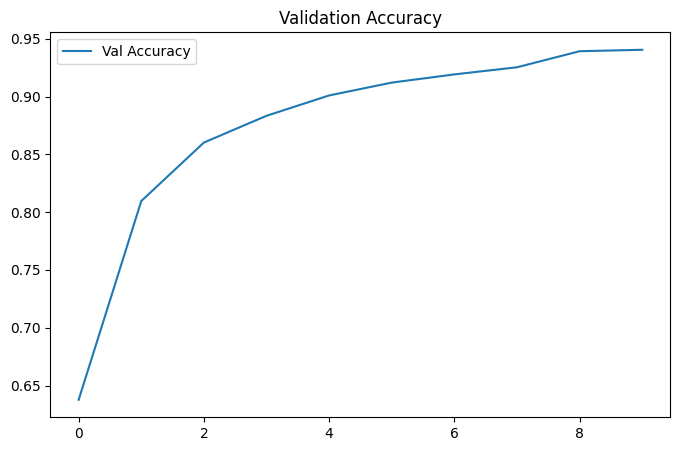

In [ ]:
# ============================================
# 1) IMPORTS
# ============================================
import torch
import torch.nn as nn
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# ============================================
# 2) DEVICE
# ============================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using Device: {device}")

# ============================================
# 3) DATASET PATH
# ============================================
TRAIN_DIR = r"D:\Gemy Study\FAI\Deep Learning\Project\processed_dataset_final"
IMAGE_SIZE = 128

# ============================================
# 4) FUNCTION TO CALCULATE MEAN & STD
# ============================================
def compute_mean_std(dataset_path):
    print("Calculating dataset mean & std ...")

    transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor()
    ])

    dataset = datasets.ImageFolder(dataset_path, transform=transform)
    loader = DataLoader(dataset, batch_size=64, shuffle=False)

    mean = 0.0
    std = 0.0
    total = 0

    for images, _ in loader:
        batch = images.size(0)
        images = images.view(batch, images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total += batch

    mean /= total
    std /= total

    print(f"Mean  = {mean}")
    print(f"Std   = {std}")
    return mean, std

# احسب mean/std مرة واحدة
mean, std = compute_mean_std(TRAIN_DIR)

# ============================================
# 5) TRANSFORMS
# ============================================
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(20),
    transforms.RandomPerspective(distortion_scale=0.3, p=0.5),
    transforms.ColorJitter(brightness=0.15, contrast=0.15),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# ============================================
# 6) LOAD DATASET WITH TRANSFORMS
# ============================================
full_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transform)

train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size

train_subset, val_subset = random_split(full_dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42))

# نغير transform للـ validation
val_subset.dataset.transform = val_transform

train_loader = DataLoader(train_subset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_subset, batch_size=32, shuffle=False)

# ============================================
# 7) CNN MODEL
# ============================================
class ASL_CNN(nn.Module):
    def __init__(self, num_classes=27):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # 3 channels بعد التحويل للـ RGB
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        # حساب حجم الـ Flatten أوتوماتيكياً
        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            dummy = self.features(dummy)
            self.flatten_dim = dummy.view(1, -1).shape[1]

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.flatten_dim, 512),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

model = ASL_CNN(len(full_dataset.classes)).to(device)

# ============================================
# 8) TRAIN SETTINGS
# ============================================
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=2)

train_losses = []
val_losses = []
val_accuracies = []

# ============================================
# 9) TRAINING LOOP
# ============================================
def train_model(epochs):
    best_acc = 0.0
    print(f"Starting Training for {epochs} epochs...")

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}", leave=False):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        # ------------------- VALIDATION ------------------
        model.eval()
        val_loss = 0
        all_preds, all_labels = [], []

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss = val_loss   / len(val_loader)
        val_acc = (np.array(all_preds) == np.array(all_labels)).mean()

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}: Train={avg_train_loss:.4f} | Val={avg_val_loss:.4f} | Acc={val_acc*100:.2f}%")

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            torch.save(model.state_dict(), "best_model.pth")

    print(f"Training Done! Best Accuracy = {best_acc*100:.2f}%")
    model.load_state_dict(torch.load("best_model.pth"))

# ============================================
# 10) RUN TRAINING
# ============================================
train_model(epochs=10)

# ============================================
# 11) PLOTS
# ============================================
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.legend()
plt.title("Loss Curve")
plt.show()

plt.figure(figsize=(8,5))
plt.plot(val_accuracies, label='Val Accuracy')
plt.legend()
plt.title("Validation Accuracy")
plt.show()


## model test

✅ Test Accuracy: 70.74%


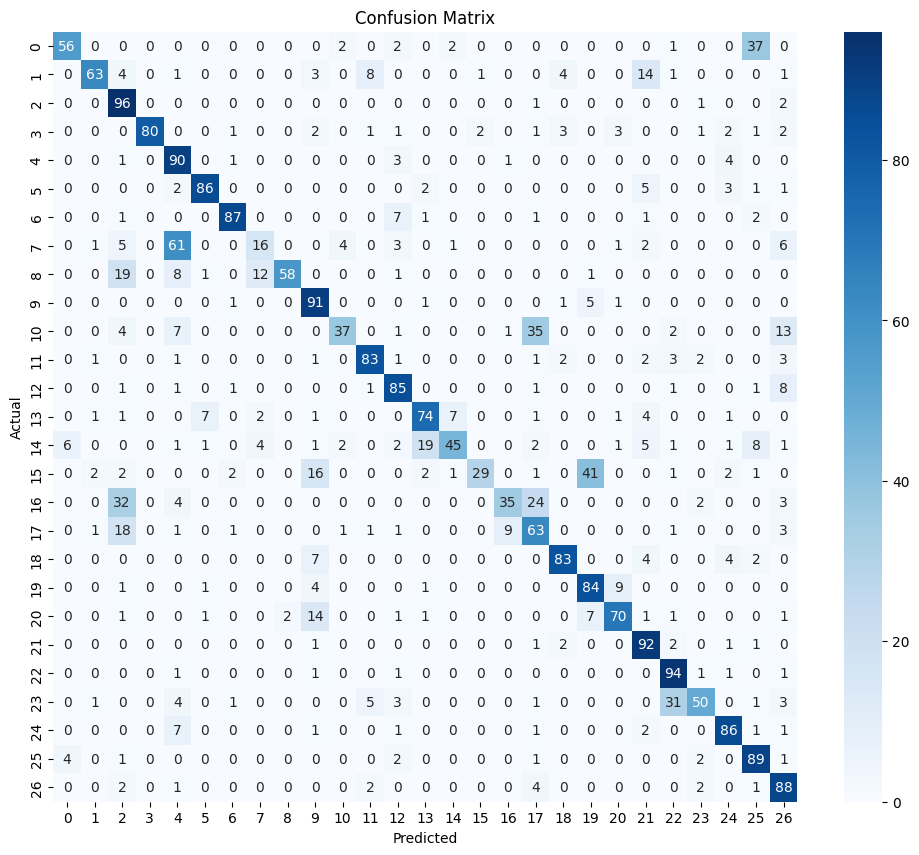

              precision    recall  f1-score   support

           A       0.85      0.56      0.67       100
           B       0.90      0.63      0.74       100
       Blank       0.51      0.96      0.66       100
           C       1.00      0.80      0.89       100
           D       0.47      0.90      0.62       100
           E       0.89      0.86      0.87       100
           F       0.92      0.87      0.89       100
           G       0.47      0.16      0.24       100
           H       0.97      0.58      0.72       100
           I       0.64      0.91      0.75       100
           J       0.80      0.37      0.51       100
           K       0.82      0.83      0.83       100
           L       0.74      0.85      0.79       100
           M       0.73      0.74      0.74       100
           N       0.80      0.45      0.58       100
           O       0.91      0.29      0.44       100
           P       0.76      0.35      0.48       100
           Q       0.45    

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================
# 1) TEST DATASET PATH
# ============================================
TEST_DIR = r"D:\Gemy Study\FAI\Deep Learning\Project\data\Test_Alphabet"  # عدل على حسب مسارك

# ============================================
# 2) TRANSFORMS (زي validation)
# ============================================
test_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)  # استخدم نفس mean/std اللي حسبتها
])

# ============================================
# 3) LOAD TEST DATASET
# ============================================
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# ============================================
# 4) LOAD MODEL
# ============================================
model = ASL_CNN(num_classes=len(test_dataset.classes)).to(device)
model.load_state_dict(torch.load("best_model.pth", weights_only=True))
model.eval()

# ============================================
# 5) EVALUATE ON TEST
# ============================================
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# ============================================
# 6) ACCURACY
# ============================================
accuracy = (np.array(all_preds) == np.array(all_labels)).mean()
print(f"Test Accuracy: {accuracy*100:.2f}%")

# ============================================
# 7) CONFUSION MATRIX
# ============================================
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ============================================
# 8) CLASSIFICATION REPORT
# ============================================
report = classification_report(all_labels, all_preds, target_names=test_dataset.classes)
print(report)


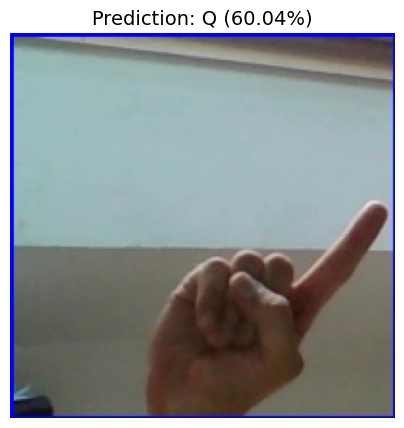

In [17]:
import torch
import cv2
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

# ============================================
# 1) PATH OF YOUR IMAGE
# ============================================
image_path = r"D:\Gemy Study\FAI\Deep Learning\Project\Z99.jpg"  # عدل هنا

# ============================================
# 2) PREPROCESSING
# ============================================
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)  # نفس mean/std اللي استخدمتها قبل كده
])

# ============================================
# 3) LOAD IMAGE
# ============================================
img = cv2.imread(image_path)
if img is None:
    raise ValueError("Image not found at the given path!")

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_tensor = preprocess(img_rgb).unsqueeze(0).to(device)

# ============================================
# 4) LOAD MODEL
# ============================================
model = ASL_CNN(num_classes=len(full_dataset.classes)).to(device)
model.load_state_dict(torch.load("best_model.pth", weights_only=True))
model.eval()

# ============================================
# 5) PREDICTION
# ============================================
with torch.no_grad():
    output = model(img_tensor)
    probs = F.softmax(output, dim=1)  # نحسب الاحتمالات
    conf, pred = torch.max(probs, 1)

predicted_class = full_dataset.classes[pred.item()]
confidence = conf.item() * 100

# ============================================
# 6) DISPLAY IMAGE WITH PREDICTION
# ============================================
plt.figure(figsize=(5,5))
plt.imshow(img_rgb)
plt.title(f"Prediction: {predicted_class} ({confidence:.2f}%)", fontsize=14)
plt.axis('off')
plt.show()


## code for test by camera

In [ ]:
## Model setup and loading trained weights
import torch
from torchvision import datasets
from torchvision import transforms
import torch.nn as nn

# ============================================
# 1) SET DEVICE
# ============================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using Device: {device}")

# ============================================
# 2) SAME PATH OF TRAINED DATASET
# ============================================
TRAIN_DIR = r"D:\Gemy Study\FAI\Deep Learning\Project\processed_dataset_final"
IMAGE_SIZE = 128

# ============================================
# 3) LOAD mean & std (اللي حسبتهم قبل التدريب)
# ============================================
mean = torch.tensor([0.4822, 0.4417, 0.3973])   # غيرهم لو عندك قيم مختلفة
std  = torch.tensor([0.2228, 0.2257, 0.2268])

# ============================================
# 4) LOAD CLASSES (للتوقع)
# ============================================
full_dataset = datasets.ImageFolder(TRAIN_DIR)
classes = full_dataset.classes
print("Loaded Classes:", classes)

# ============================================
# 5) DEFINE SAME CNN MODEL
# ============================================
class ASL_CNN(nn.Module):
    def __init__(self, num_classes=27):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            dummy = self.features(dummy)
            self.flatten_dim = dummy.view(1, -1).shape[1]

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.flatten_dim, 512),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# ============================================
# 6) LOAD MODEL + WEIGHTS
# ============================================
model = ASL_CNN(num_classes=len(classes)).to(device)
model.load_state_dict(torch.load("best_model.pth", map_location=device))
model.eval()

print("Model Loaded Successfully!")

Using Device: cuda
Loaded Classes: ['A', 'B', 'Blank', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
✅ Model Loaded Successfully!


C:\Users\Mostafa\AppData\Local\Temp\ipykernel_8852\3394705255.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_model.pth", map_loc

In [ ]:
## Code for Real-time Hand Sign Recognition using Webcam
import cv2
from PIL import Image
import torch
from torchvision import transforms
import mediapipe as mp
import torch.nn.functional as F

# ============================================
# 1) SETUP MEDIA PIPE HANDS
# ============================================
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(
    static_image_mode=False,
    max_num_hands=1,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5
)

# ============================================
# 2) TRANSFORMS (مثل validation)
# ============================================
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# ============================================
# 3) OPEN WEBCAM
# ============================================
cap = cv2.VideoCapture(0)
if not cap.isOpened():
    print("Cannot open webcam")
    exit()

print("Webcam started. Press 'q' to quit.")

# ============================================
# 4) REALTIME LOOP
# ============================================
while True:
    ret, frame = cap.read()
    if not ret:
        break

    img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = hands.process(img_rgb)
    h, w, _ = frame.shape

    if results.multi_hand_landmarks:
        # Get bounding box
        x_min, y_min, x_max, y_max = w, h, 0, 0
        for lm in results.multi_hand_landmarks[0].landmark:
            x, y = int(lm.x * w), int(lm.y * h)
            x_min, y_min = min(x_min, x), min(y_min, y)
            x_max, y_max = max(x_max, x), max(y_max, y)

        pad = 60
        x_min, y_min = max(0, x_min - pad), max(0, y_min - pad)
        x_max, y_max = min(w, x_max + pad), min(h, y_max + pad)

        # Crop and preprocess hand region
        hand_img = img_rgb[y_min:y_max, x_min:x_max]
        pil_img = Image.fromarray(hand_img)
        img_tensor = transform(pil_img).unsqueeze(0).to(device)

        # Prediction
        model.eval()
        with torch.no_grad():
            output = model(img_tensor)
            probs = F.softmax(output, dim=1)
            conf, pred_idx = torch.max(probs, 1)

        pred_label = full_dataset.classes[pred_idx.item()]
        conf_score = conf.item() * 100

        # Draw bounding box
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

        # Put prediction text above box
        text = f"{pred_label} ({conf_score:.1f}%)"
        text_y = max(30, y_min - 10)  # فوق الـ box
        color = (0, 255, 0) if conf_score > 70 else (0, 165, 255) if conf_score > 40 else (0, 0, 255)
        cv2.putText(frame, text, (x_min, text_y), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)

    # Show frame
    cv2.imshow("Hand Sign Recognition", frame)

    # Quit with 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


🚀 Webcam started. Press 'q' to quit.


d:\Gemy Study\FAI\Deep Learning\Project\DL_env\Lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '
